In [1]:
import os
import tensorflow as tf

os.environ["TFHUB_MODEL_LOAD_FORMAT"] = "COMPRESSED"

In [2]:
from IPython import display

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

import PIL.Image
import time
import functools

mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

In [10]:
def tensor_to_image(t):
  t = t * 255
  t = np.array(t, dtype=np.uint8)

  if np.ndim(t) > 3:
    assert t.shape[0] == 1
    t = t[0]

  return PIL.Image.fromarray(t)

In [5]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

195196/195196 [==============================] - 0s 0us/step


In [6]:
def load_img(path):
  max_dim = 512

  img = tf.io.read_file(path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)

  scale = max_dim / long_dim
  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]

  return img

In [7]:
def imshow(img, title=None):
  if len(img.shape) > 3:
    img = tf.squeeze(img, axis=0)

  plt.imshow(img)
  if title: plt.title(title)


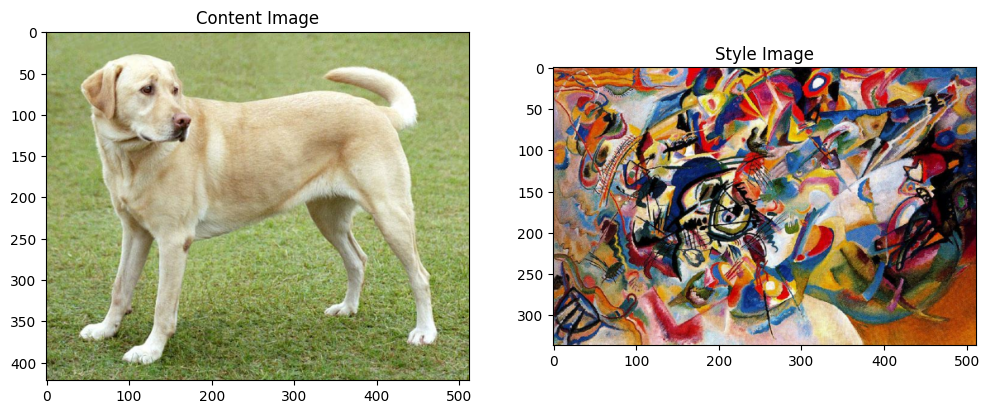

In [8]:
content_img = load_img(content_path)
style_img = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_img, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_img, 'Style Image')

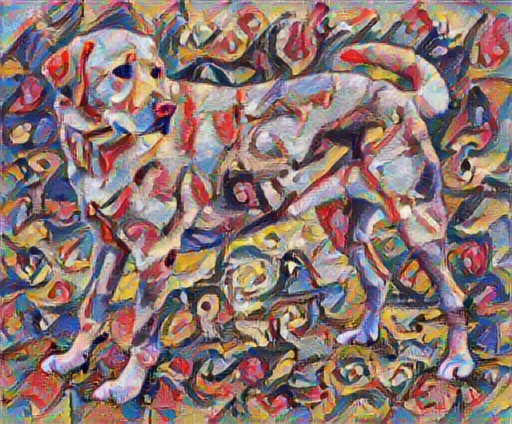

In [11]:
import tensorflow_hub as hub

# check model from TF Hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

stylized_img = hub_model(tf.constant(content_img), tf.constant(style_img))[0]
tensor_to_image(stylized_img)

In [12]:
# check an image on vgg19

x = tf.keras.applications.vgg19.preprocess_input(content_img * 255)
x = tf.image.resize(x, [224, 224])

vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')

pred_probs = vgg(x)
pred_probs.shape

574710816/574710816 [==============================] - 7s 0us/step


TensorShape([1, 1000])

In [13]:
pred_top_5 = tf.keras.applications.vgg19.decode_predictions(pred_probs.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in pred_top_5]

35363/35363 [==============================] - 0s 0us/step


[('Labrador_retriever', 0.49317262),
 ('golden_retriever', 0.23665187),
 ('kuvasz', 0.036357313),
 ('Chesapeake_Bay_retriever', 0.024182774),
 ('Greater_Swiss_Mountain_dog', 0.018646035)]

In [14]:
# don't need the classification head
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

for layer in vgg.layers: print(layer.name)

80134624/80134624 [==============================] - 1s 0us/step
input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [17]:
# using a deeper layer that understands high level concepts for content
content_layers = ['block5_conv2']
# using layers at different depths for style
style_layers = [f"block{i}_conv1" for i in range(1, 6)]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [18]:
def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outs)

  return model

In [20]:
style_extractor = vgg_layers(style_layers)
style_outs = style_extractor(style_img*255)

# inspect each layer's output
for name, out in zip(style_layers, style_outs):
  print(name)
  print(f"\tshape: {out.numpy().shape}")
  print(f"\tmin: {out.numpy().min()}")
  print(f"\tmax: {out.numpy().max()}")
  print(f"\tmean: {out.numpy().mean()}")
  print()

block1_conv1
	shape: (1, 336, 512, 64)
	min: 0.0
	max: 835.5255126953125
	mean: 33.975250244140625

block2_conv1
	shape: (1, 168, 256, 128)
	min: 0.0
	max: 4625.88671875
	mean: 199.82687377929688

block3_conv1
	shape: (1, 84, 128, 256)
	min: 0.0
	max: 8789.240234375
	mean: 230.78099060058594

block4_conv1
	shape: (1, 42, 64, 512)
	min: 0.0
	max: 21566.1328125
	mean: 791.2400512695312

block5_conv1
	shape: (1, 21, 32, 512)
	min: 0.0
	max: 3189.253173828125
	mean: 59.17947769165039



In [21]:
# style is described by means and correlations across feature maps
# Gram Matrix can calculate these
# Gram Matrix for layer l in all locations i, j in feature maps F_c and F_d:
# G^l_cd = sum_ij( F^l_ijc(x) F^l_ijd(x) ) / IJ
def gram_matrix(input_tensor):
  # specify equation as indices:
  # output[batch, c, d] = input[batch, i, j, c] * input[batch, i, j, d]
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)

  input_shape = tf.shape(input_tensor)
  num_locs = tf.cast(input_shape[1]*input_shape[2], tf.float32)

  return result / num_locs

In [22]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()

    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)

    self.vgg.trainable = False

  def call(self, inputs):
    inputs = inputs * 255
    preprocessed_inputs = tf.keras.applications.vgg19.preprocess_input(inputs)

    outs = self.vgg(preprocessed_inputs)
    style_outs, content_outs = (outs[:self.num_style_layers], outs[self.num_style_layers:])

    style_outs = [gram_matrix(style_out) for style_out in style_outs]

    content_dict = {content_name:value for content_name, value in zip(self.content_layers, content_outs)}
    style_dict = {style_name:value for style_name, value in zip(self.style_layers, style_outs)}

    return {'content': content_dict, 'style': style_dict}

In [24]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_img))

print('Styles:')
for name, out in sorted(results['style'].items()):
  print(f"\t{name}")
  print(f"\tshape: {out.numpy().shape}")
  print(f"\tmin: {out.numpy().min()}")
  print(f"\tmax: {out.numpy().max()}")
  print(f"\tmean: {out.numpy().mean()}")
  print()

print("Contents:")
for name, out in sorted(results['content'].items()):
  print(f"\t{name}")
  print(f"\tshape: {out.numpy().shape}")
  print(f"\tmin: {out.numpy().min()}")
  print(f"\tmax: {out.numpy().max()}")
  print(f"\tmean: {out.numpy().mean()}")

Styles:
	block1_conv1
	shape: (1, 64, 64)
	min: 0.005522848106920719
	max: 28014.564453125
	mean: 263.7902526855469

	block2_conv1
	shape: (1, 128, 128)
	min: 0.0
	max: 61479.50390625
	mean: 9100.9501953125

	block3_conv1
	shape: (1, 256, 256)
	min: 0.0
	max: 545623.4375
	mean: 7660.9765625

	block4_conv1
	shape: (1, 512, 512)
	min: 0.0
	max: 4320501.0
	mean: 134288.859375

	block5_conv1
	shape: (1, 512, 512)
	min: 0.0
	max: 110005.3828125
	mean: 1487.0380859375

Contents:
	block5_conv2
	shape: (1, 26, 32, 512)
	min: 0.0
	max: 2410.879638671875
	mean: 13.764151573181152


In [25]:
style_targets = extractor(style_img)['style']
content_targets = extractor(content_img)['content']

In [26]:
img = tf.Variable(content_img)

In [27]:
def clip_0_1(img): return tf.clip_by_value(img, 0.0, 1.0)

In [28]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [29]:
style_weight = 1e-2
content_weight = 1e4

def style_content_loss(outs):
  style_outs, content_outs = outs['style'], outs['content']

  # mean squared error
  style_loss = tf.add_n([
      tf.reduce_mean(
          (style_outs[name] - style_targets[name])**2
          ) for name in style_outs.keys()
          ])
  content_loss = tf.add_n([
      tf.reduce_mean(
          (content_outs[name] - content_targets[name])**2
          ) for name in content_outs.keys()
  ])

  loss = style_loss + (content_weight / num_content_layers) * content_loss
  return loss

In [30]:
@tf.function()
def train_step(img):
  with tf.GradientTape() as tape:
    outs = extractor(img)
    loss = style_content_loss(outs)

  grads = tape.gradient(loss, img)
  opt.apply_gradients([(grads, img)])

  img.assign(clip_0_1(img))

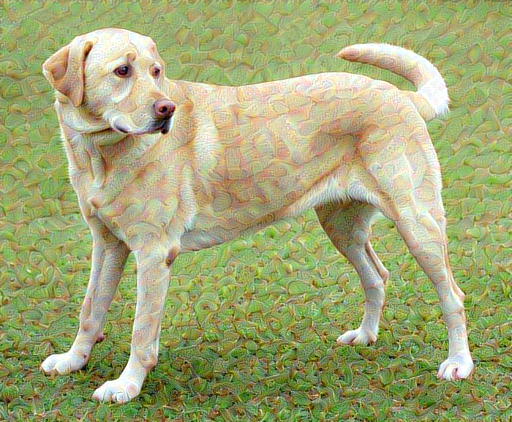

In [31]:
# check if it works

train_step(img)
train_step(img)
train_step(img)

tensor_to_image(img)

..

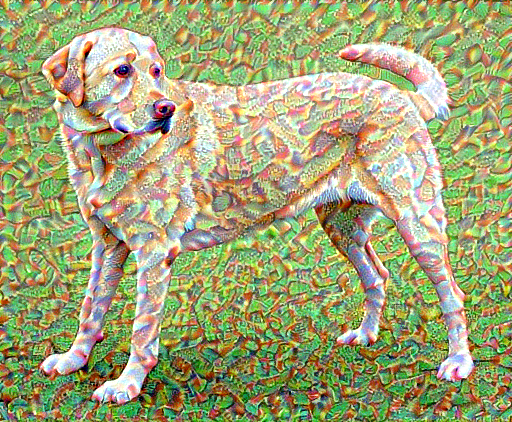

Train step: 2
..

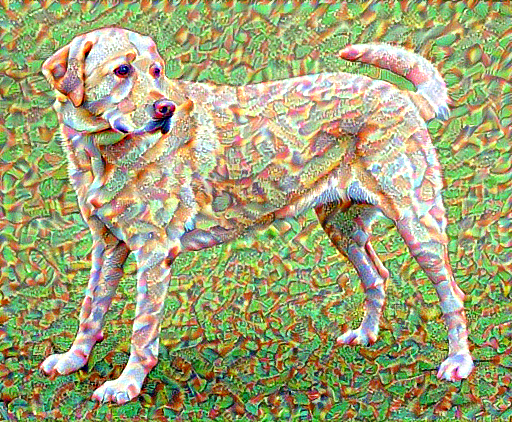

Train step: 4
..

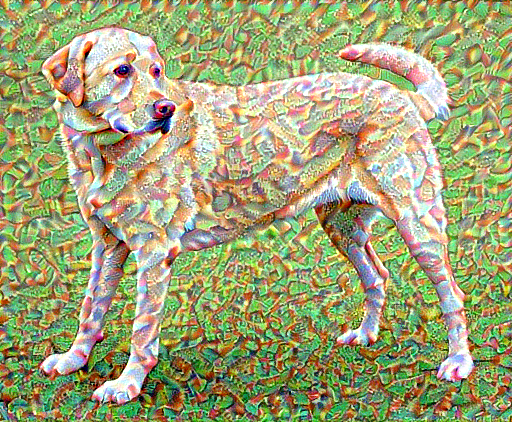

Train step: 6
..

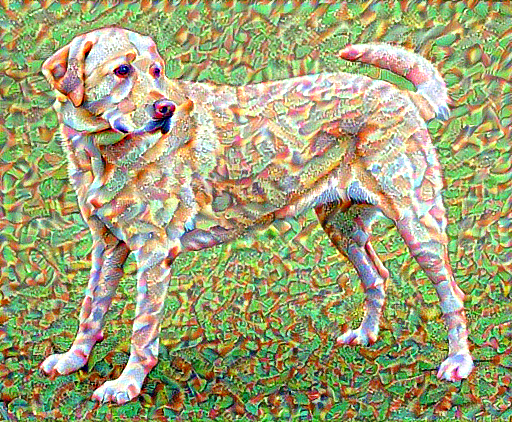

Train step: 8
..

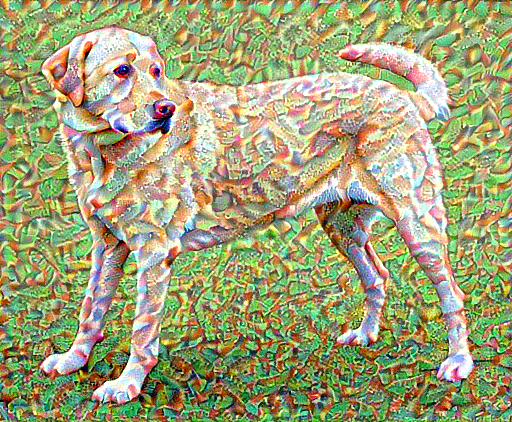

Train step: 10
..

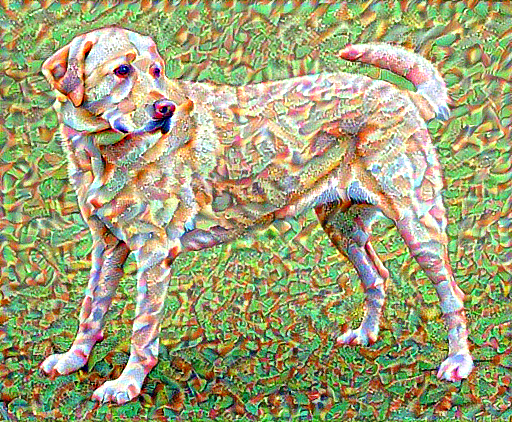

Train step: 12
..

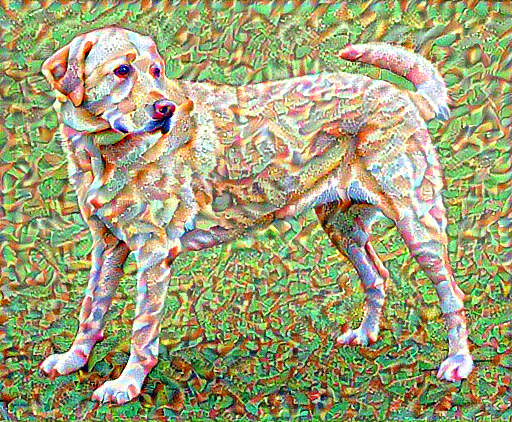

Train step: 14
..

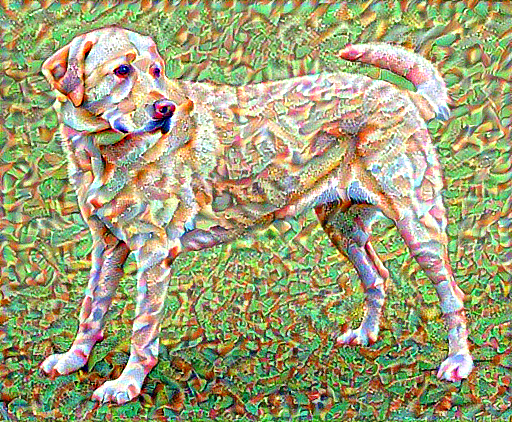

Train step: 16
..

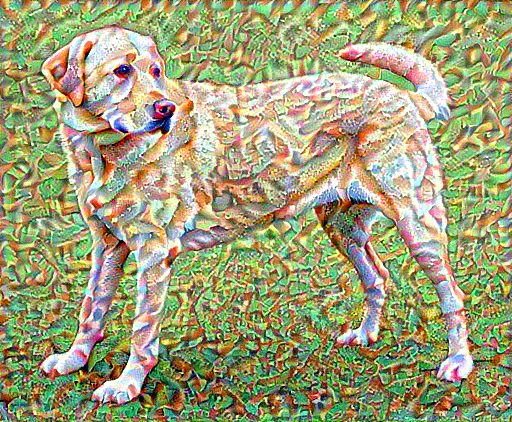

Train step: 18
..

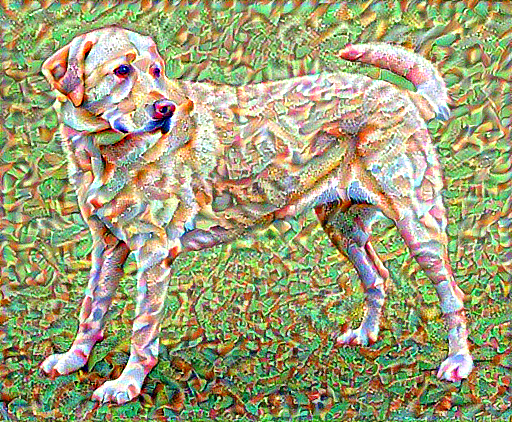

Train step: 20
Total time: 219.0


In [34]:
import time

start = time.time()

epochs = 10
steps_per_epoch = 2

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(img)
    print('.', end='', flush=True)

  # display.clear_output(wait=True)
  display.display(tensor_to_image(img))

  print(f"Train step: {step}")

end = time.time()
print(f"Total time: {end - start:.1f}")

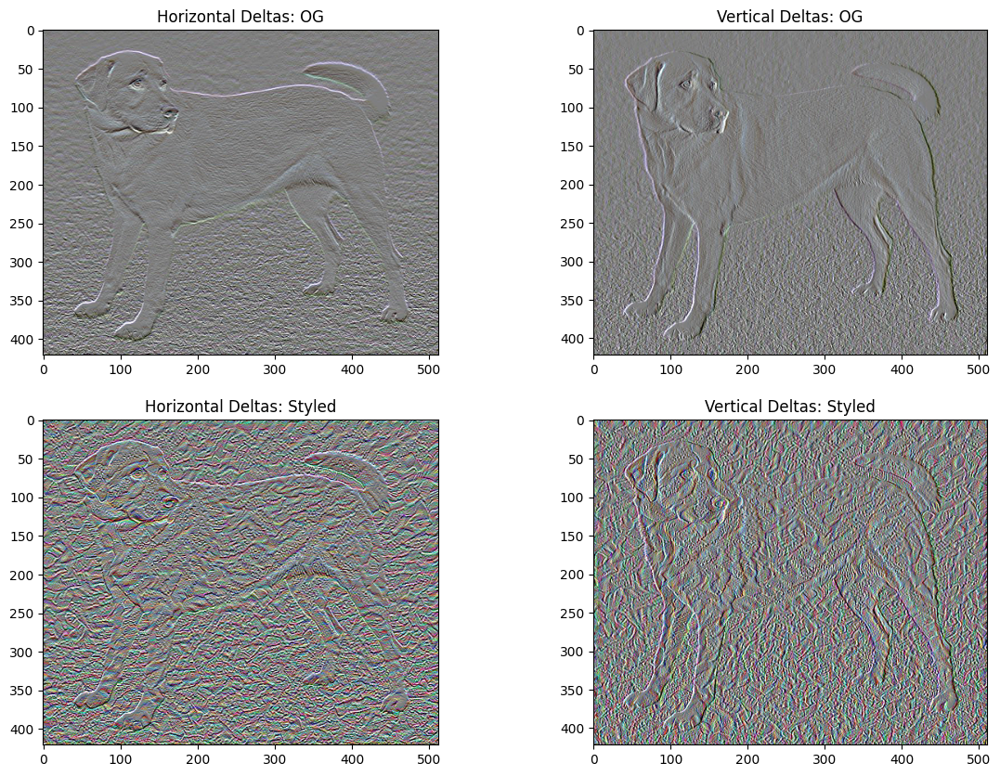

In [52]:
# use "total variation loss" regularization term to reduce high frequency artifacts


# visualize high freq components using 1st derivative
def high_pass_x_y(img):
  x_var = img[:, :, 1:, :] - img[:, :, :-1, :]
  y_var = img[:, 1:, :, :] - img[:, :-1, :, :]

  return x_var, y_var


plt.figure(figsize=(14, 10))
fignum = 1
for img, which_img in [(content_img, "OG"), (img, "Styled")]:
  x_deltas, y_deltas = high_pass_x_y(img)


  plt.subplot(2, 2, fignum)
  imshow(clip_0_1(2*y_deltas+0.5), f'Horizontal Deltas: {which_img}')

  plt.subplot(2, 2, fignum+1)
  imshow(clip_0_1(2*x_deltas+0.5), f'Vertical Deltas: {which_img}')

  fignum += 2

In [37]:
def total_variation_loss(img):
  x_deltas, y_deltas = high_pass_x_y(img)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [38]:
# there's also built-in implementation
print(total_variation_loss(content_img).numpy(), tf.image.total_variation(content_img).numpy())
print(total_variation_loss(img).numpy(), tf.image.total_variation(img).numpy())

43371.33 [43371.33]
153072.4 [153072.4]


In [53]:
total_variation_weight = 10_000

@tf.function()
def train_step(img):
  with tf.GradientTape() as tape:
    outs = extractor(img)
    loss = style_content_loss(outs)
    loss += total_variation_weight * tf.image.total_variation(img)

  grads = tape.gradient(loss, img)
  opt.apply_gradients([(grads, img)])

  img.assign(clip_0_1(img))

In [54]:
# re-initialize
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
img = tf.Variable(content_img)

..

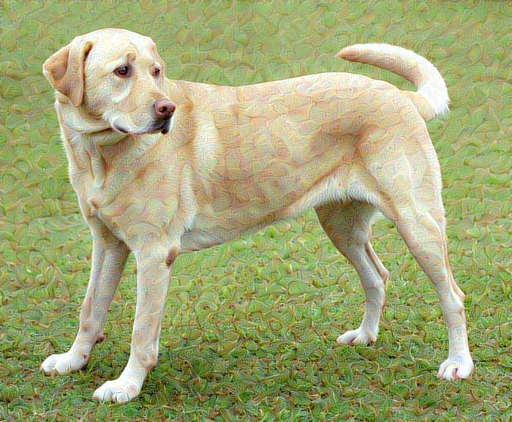

Train step: 2
..

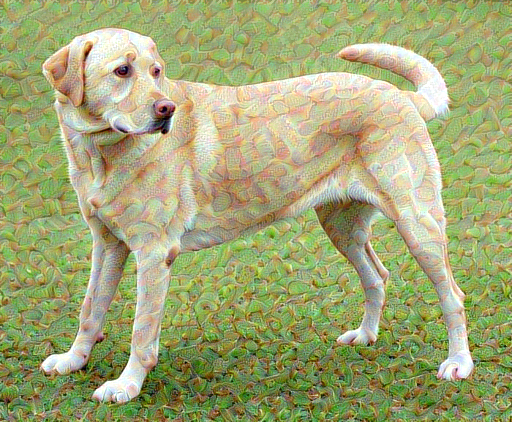

Train step: 4
..

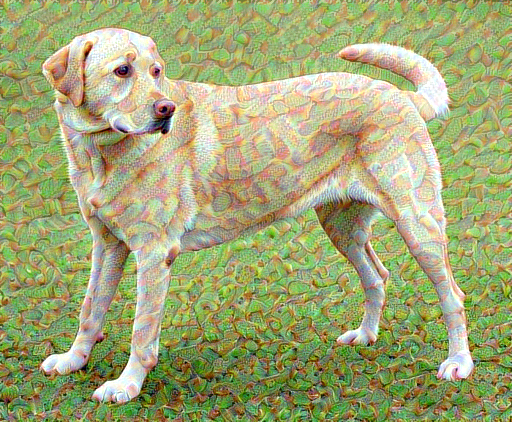

Train step: 6
..

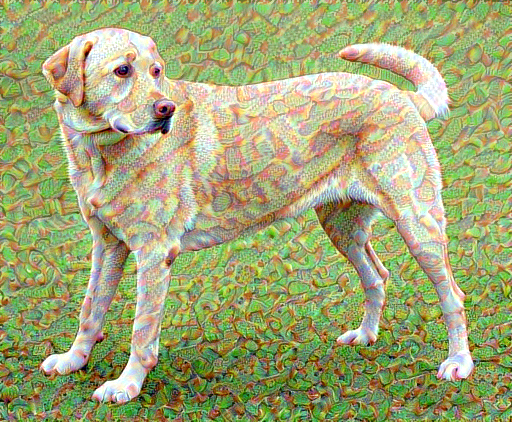

Train step: 8
..

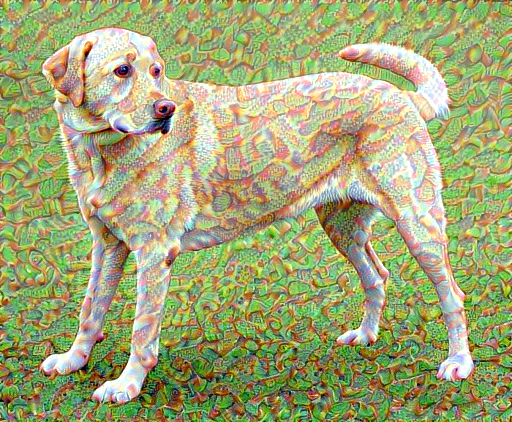

Train step: 10
..

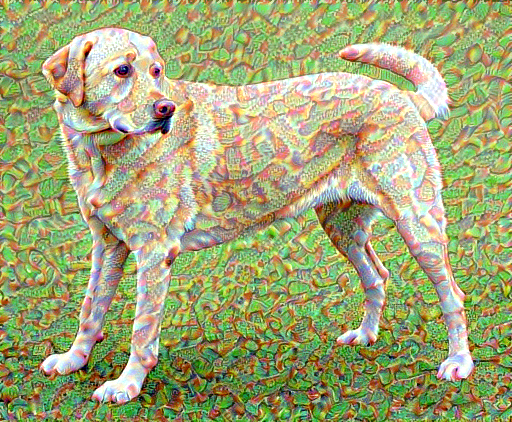

Train step: 12
..

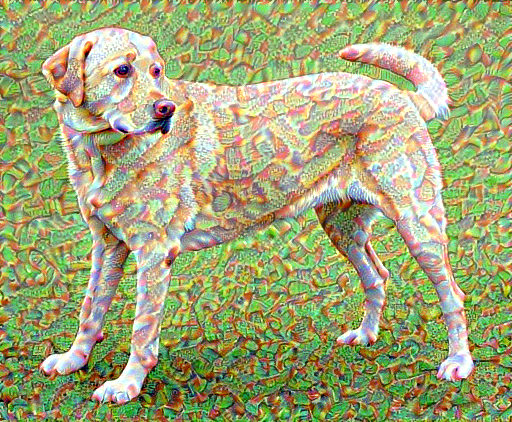

Train step: 14
..

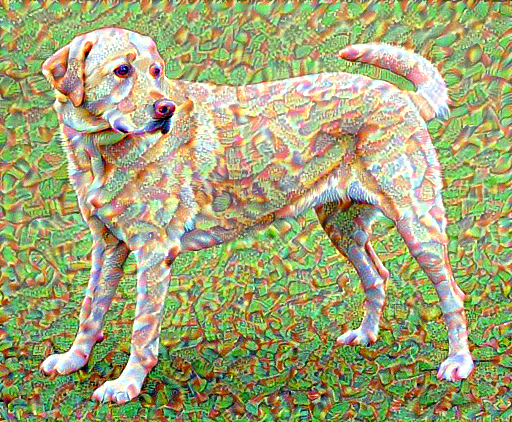

Train step: 16
..

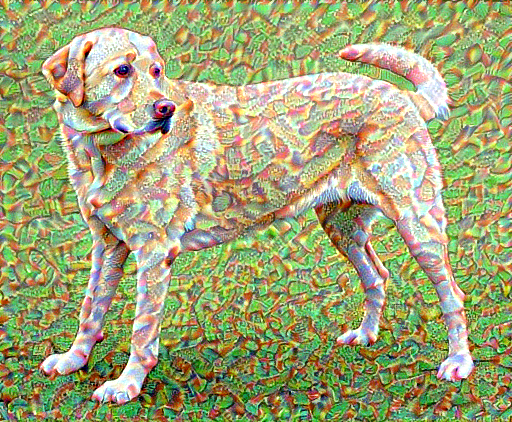

Train step: 18
..

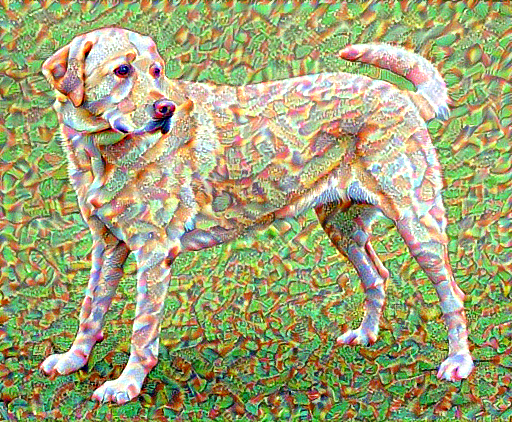

Train step: 20
Total time: 176.5


In [55]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 2

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(img)
    print(".", end='', flush=True)

  display.display(tensor_to_image(img))
  print(f"Train step: {step}")

end = time.time()
print(f"Total time: {end-start:.1f}")

In [46]:
filename = 'stylized-image.png'
tensor_to_image(img).save(filename)
try:
  from google.colab import files
  files.download(filename)
except (ImportError, AttributeError): pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>